In [4]:
import reverse_geocoder
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import folium
import pandas as pd
import numpy as np

In [5]:
dataset = pd.read_csv("amazon_delivery.csv")

In [6]:
dataset.head()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
0,ialx566343618,37,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,120,Clothing
1,akqg208421122,34,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,165,Electronics
2,njpu434582536,23,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,130,Sports
3,rjto796129700,38,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,105,Cosmetics
4,zguw716275638,32,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,150,Toys


In [7]:
dataset.tail()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
43734,jlxf819993117,30,4.8,26.902328,75.794257,26.912328,75.804257,2022-03-24,11:35:00,11:45:00,Windy,High,motorcycle,Metropolitian,160,Home
43735,aevx342135787,21,4.6,0.000000,0.000000,0.070000,0.070000,2022-02-16,19:55:00,20:10:00,Windy,Jam,motorcycle,Metropolitian,180,Jewelry
43736,xnek760674819,30,4.9,13.022394,80.242439,13.052394,80.272439,2022-03-11,23:50:00,00:05:00,Cloudy,Low,scooter,Metropolitian,80,Home
43737,cynl434665991,20,4.7,11.001753,76.986241,11.041753,77.026241,2022-03-07,13:35:00,13:40:00,Cloudy,High,motorcycle,Metropolitian,130,Kitchen
43738,nsyz997960170,23,4.9,23.351058,85.325731,23.431058,85.405731,2022-03-02,17:10:00,17:15:00,Fog,Medium,scooter,Metropolitian,180,Cosmetics


In [8]:
dataset.describe()

,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Delivery_Time
count,43739.000000,43685.000000,43739.000000,43739.000000,43739.000000,43739.000000,43739.000000
mean,29.567137,4.633780,17.210960,70.661177,17.459031,70.821842,124.905645
std,5.815155,0.334716,7.764225,21.475005,7.342950,21.153148,51.915451
min,15.000000,1.000000,-30.902872,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.500000,12.933298,73.170283,12.985996,73.280000,90.000000
50%,30.000000,4.700000,18.551440,75.898497,18.633626,76.002574,125.000000
75%,35.000000,4.900000,22.732225,78.045359,22.785049,78.104095,160.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,270.000000


In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43739 entries, 0 to 43738
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order_ID         43739 non-null  object 
 1   Agent_Age        43739 non-null  int64  
 2   Agent_Rating     43685 non-null  float64
 3   Store_Latitude   43739 non-null  float64
 4   Store_Longitude  43739 non-null  float64
 5   Drop_Latitude    43739 non-null  float64
 6   Drop_Longitude   43739 non-null  float64
 7   Order_Date       43739 non-null  object 
 8   Order_Time       43739 non-null  object 
 9   Pickup_Time      43739 non-null  object 
 10  Weather          43648 non-null  object 
 11  Traffic          43739 non-null  object 
 12  Vehicle          43739 non-null  object 
 13  Area             43739 non-null  object 
 14  Delivery_Time    43739 non-null  int64  
 15  Category         43739 non-null  object 
dtypes: float64(5), int64(2), object(9)
memory usage: 5.3+ MB


In [10]:
dataset.isnull().sum()

Order_ID            0
Agent_Age           0
Agent_Rating       54
Store_Latitude      0
Store_Longitude     0
Drop_Latitude       0
Drop_Longitude      0
Order_Date          0
Order_Time          0
Pickup_Time         0
Weather            91
Traffic             0
Vehicle             0
Area                0
Delivery_Time       0
Category            0
dtype: int64

AGENT RATING AND WEATHER CONTAINS SOME NULL VALUES. WE WILL FILL IN THOSE VALUES USING SIMPLE IMPUTER FROM SKLEARN

In [11]:
catImputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
catImputer = catImputer.fit(dataset[['Agent_Rating', 'Weather']])
dataset[['Agent_Rating', 'Weather']] = catImputer.transform(dataset[['Agent_Rating', 'Weather']])

In [12]:
dataset.isnull().sum()

Order_ID           0
Agent_Age          0
Agent_Rating       0
Store_Latitude     0
Store_Longitude    0
Drop_Latitude      0
Drop_Longitude     0
Order_Date         0
Order_Time         0
Pickup_Time        0
Weather            0
Traffic            0
Vehicle            0
Area               0
Delivery_Time      0
Category           0
dtype: int64

In [13]:
dataset[dataset['Traffic'] == 'NaN ']

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
2286,xige084493792,15,1.0,-26.891191,75.802083,26.981191,75.892083,2022-03-12,NaN,17:20:00,Fog,NaN,motorcycle,Urban,75,Home
2779,oilg311747812,15,1.0,22.750040,75.902847,22.810040,75.962847,2022-04-03,NaN,20:30:00,Fog,NaN,scooter,Metropolitian,145,Kitchen
2825,pbox816153129,15,1.0,21.149569,72.772697,21.209569,72.832697,2022-03-21,NaN,22:10:00,Fog,NaN,bicycle,Metropolitian,100,Clothing
3438,nzsa056960624,50,6.0,-12.970324,-77.645748,13.010324,77.685748,2022-03-13,NaN,12:30:00,Fog,NaN,van,Urban,125,Cosmetics
4514,eids248121351,50,6.0,-17.451976,-78.385883,17.561976,78.495883,2022-04-04,NaN,23:20:00,Fog,NaN,bicycle,Metropolitian,135,Jewelry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40359,lasg907081524,50,6.0,22.751234,75.889490,22.781234,75.919490,2022-03-17,NaN,20:40:00,Fog,NaN,scooter,Metropolitian,140,Apparel
41088,wgdm794380305,50,6.0,-12.939496,77.625999,12.949496,77.635999,2022-03-19,NaN,09:40:00,Fog,NaN,van,Metropolitian,95,Books
42598,llox673359294,15,1.0,0.000000,0.000000,0.070000,0.070000,2022-03-14,NaN,17:40:00,Fog,NaN,scooter,Metropolitian,170,Jewelry
43053,ifig993965994,15,1.0,13.086438,80.220672,13.216439,80.350672,2022-03-18,NaN,18:00:00,Fog,NaN,van,Urban,130,Jewelry


In [14]:
dataset[dataset['Traffic'] == 'NaN ']

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
2286,xige084493792,15,1.0,-26.891191,75.802083,26.981191,75.892083,2022-03-12,NaN,17:20:00,Fog,NaN,motorcycle,Urban,75,Home
2779,oilg311747812,15,1.0,22.750040,75.902847,22.810040,75.962847,2022-04-03,NaN,20:30:00,Fog,NaN,scooter,Metropolitian,145,Kitchen
2825,pbox816153129,15,1.0,21.149569,72.772697,21.209569,72.832697,2022-03-21,NaN,22:10:00,Fog,NaN,bicycle,Metropolitian,100,Clothing
3438,nzsa056960624,50,6.0,-12.970324,-77.645748,13.010324,77.685748,2022-03-13,NaN,12:30:00,Fog,NaN,van,Urban,125,Cosmetics
4514,eids248121351,50,6.0,-17.451976,-78.385883,17.561976,78.495883,2022-04-04,NaN,23:20:00,Fog,NaN,bicycle,Metropolitian,135,Jewelry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40359,lasg907081524,50,6.0,22.751234,75.889490,22.781234,75.919490,2022-03-17,NaN,20:40:00,Fog,NaN,scooter,Metropolitian,140,Apparel
41088,wgdm794380305,50,6.0,-12.939496,77.625999,12.949496,77.635999,2022-03-19,NaN,09:40:00,Fog,NaN,van,Metropolitian,95,Books
42598,llox673359294,15,1.0,0.000000,0.000000,0.070000,0.070000,2022-03-14,NaN,17:40:00,Fog,NaN,scooter,Metropolitian,170,Jewelry
43053,ifig993965994,15,1.0,13.086438,80.220672,13.216439,80.350672,2022-03-18,NaN,18:00:00,Fog,NaN,van,Urban,130,Jewelry


In [15]:
catImputer = SimpleImputer(missing_values="NaN ", strategy='most_frequent')
catImputer = catImputer.fit(dataset[['Order_Time', "Traffic"]])
dataset[['Order_Time', "Traffic"]] = catImputer.transform(dataset[['Order_Time', "Traffic"]])

In [16]:
dataset[dataset['Traffic'] == 'NaN ']

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category


FEATURE ENGINEERING

In [17]:
# Convert the Order_Time column to datetime.time, handling errors if any occur
dataset['Pickup_Time'] = pd.to_datetime(dataset['Pickup_Time'], format='%H:%M:%S', errors='coerce').dt.time

In [18]:
# Defining funtion to extract time of day
def categorize_time(t):
    if t < pd.to_datetime('06:00:00').time():
        return 'Pre-dawn (00:00 - 06:00)'
    elif t < pd.to_datetime('12:00:00').time():
        return 'Morning (06:00 - 12:00)'
    elif t < pd.to_datetime('18:00:00').time():
        return 'Afternoon (12:00 - 18:00)'
    elif t < pd.to_datetime('23:59:59').time():
        return 'Night (18:00 - 00:00)'

In [19]:
# Apply the categorize_time function to the dataframe
dataset['Time_Category'] = dataset['Pickup_Time'].apply(categorize_time)

In [20]:
# Extract day of the week to new column
dataset['Order_Date'] = pd.to_datetime(dataset['Order_Date'], format='%Y-%m-%d')
dataset['Day_of_Week'] = dataset['Order_Date'].dt.day_name()

In [21]:
dataset.head()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category,Time_Category,Day_of_Week
0,ialx566343618,37,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,120,Clothing,Morning (06:00 - 12:00),Saturday
1,akqg208421122,34,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,165,Electronics,Night (18:00 - 00:00),Friday
2,njpu434582536,23,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,130,Sports,Morning (06:00 - 12:00),Saturday
3,rjto796129700,38,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,105,Cosmetics,Night (18:00 - 00:00),Tuesday
4,zguw716275638,32,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,150,Toys,Afternoon (12:00 - 18:00),Saturday


In [22]:
# Convertin coordinates columns into 2D arrays and running them against the reverse geocoder 
# reverse_geocoder extracts the country and city names based on the longitude and latitude.
drop_coordinates_list = list(zip(dataset['Drop_Latitude'], dataset['Drop_Longitude']))
drop_locations = reverse_geocoder.search(drop_coordinates_list ,mode=1)

store_coordinates_list = list(zip(dataset['Store_Latitude'], dataset['Store_Longitude']))
store_locations = reverse_geocoder.search(store_coordinates_list ,mode=1)

Loading formatted geocoded file...


In [23]:
# converting final output from reverse_geocoder into dataframes
drop_locations_df = pd.DataFrame(drop_locations)
store_locations_df = pd.DataFrame(store_locations)

In [24]:
# Renaming column names for more readability 
drop_locations_df.rename(columns={'name': 'Destination_City', 'cc': 'Destination_Country'}, inplace=True)
store_locations_df.rename(columns={'name': 'Store_City', 'cc': 'Store_Country'}, inplace=True)

In [25]:
drop_locations_df.head()

,lat,lon,Destination_City,admin1,admin2,Destination_Country
0,22.71792,75.8333,Indore,Madhya Pradesh,Indore,IN
1,13.0707,77.79814,Hoskote,Karnataka,Bangalore Rural,IN
2,12.97194,77.59369,Bangalore,Karnataka,Bangalore Urban,IN
3,11.01867,77.06624,Irugur,Tamil Nadu,Coimbatore,IN
4,13.00639,80.25417,Gandhi Nagar,Tamil Nadu,Chennai,IN


In [26]:
store_locations_df.head()

,lat,lon,Store_City,admin1,admin2,Store_Country
0,22.71792,75.8333,Indore,Madhya Pradesh,Indore,IN
1,12.97194,77.59369,Bangalore,Karnataka,Bangalore Urban,IN
2,12.97194,77.59369,Bangalore,Karnataka,Bangalore Urban,IN
3,11.00555,76.96612,Coimbatore,Tamil Nadu,Coimbatore,IN
4,12.96095,80.24094,Perungudi,Tamil Nadu,Kancheepuram,IN


In [27]:
drop_locations_df_city_country = drop_locations_df[['Destination_City', 'Destination_Country']]
store_locations_df_city_country = store_locations_df[['Store_City', 'Store_Country']]

In [28]:
drop_locations_df_city_country.head()

,Destination_City,Destination_Country
0,Indore,IN
1,Hoskote,IN
2,Bangalore,IN
3,Irugur,IN
4,Gandhi Nagar,IN


In [29]:
store_locations_df_city_country.head()

,Store_City,Store_Country
0,Indore,IN
1,Bangalore,IN
2,Bangalore,IN
3,Coimbatore,IN
4,Perungudi,IN


In [30]:
# joining the location dataframes to the main dataset
dataset = pd.concat([dataset, store_locations_df_city_country, drop_locations_df_city_country], axis=1)

In [31]:
# Dropping the unnecessary columns to align with our main aim
dataset = dataset.drop(columns=["Agent_Age", "Agent_Rating", "Delivery_Time"])

In [32]:
dataset.head()

,Order_ID,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Category,Time_Category,Day_of_Week,Store_City,Store_Country,Destination_City,Destination_Country
0,ialx566343618,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,Clothing,Morning (06:00 - 12:00),Saturday,Indore,IN,Indore,IN
1,akqg208421122,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,Electronics,Night (18:00 - 00:00),Friday,Bangalore,IN,Hoskote,IN
2,njpu434582536,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,Sports,Morning (06:00 - 12:00),Saturday,Bangalore,IN,Bangalore,IN
3,rjto796129700,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,Cosmetics,Night (18:00 - 00:00),Tuesday,Coimbatore,IN,Irugur,IN
4,zguw716275638,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,Toys,Afternoon (12:00 - 18:00),Saturday,Perungudi,IN,Gandhi Nagar,IN


In [33]:
def haversine(lat1, lon1, lat2, lon2):
    # Convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    
    # Radius of Earth in kilometers (mean radius)
    r = 6371  
    return r * c

In [34]:
dataset['Distance_km'] = dataset.apply(lambda row: haversine(row['Store_Latitude'], row['Store_Longitude'], row['Drop_Latitude'], 
                                                             row['Drop_Longitude']), axis=1)



PLOT GRAPH

In [35]:
# Defining duncrion for plotting of a barplot
def plot_frequency(dataframe, column, range):
    sns.set(style="whitegrid")
    # plt.rcParams['figure.dpi'] = 600
    # plt.rcParams['savefig.dpi'] = 600
    
    # Count the frequency each distinct value in the column
    if range == 'all':
        category_counts = dataframe[column].value_counts().reset_index()
    else:
        category_counts = dataframe[column].value_counts().head(range).reset_index()
    category_counts.columns = [column, 'Frequency']

    # Create the bar plot
    plt.figure(figsize=(18,6))
    bar_plot = sns.barplot(x=column, y='Frequency', hue=column, data=category_counts, palette='coolwarm', dodge=False, legend=False)
    
    plt.title(f'Frequency of {column}', fontsize=14)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    
    for p in bar_plot.patches:
        bar_plot.annotate(f'{int(p.get_height())}', 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', 
                      fontsize=12, color='black', 
                      xytext=(0, 5),  # Offset text slightly above the bar
                      textcoords='offset points')

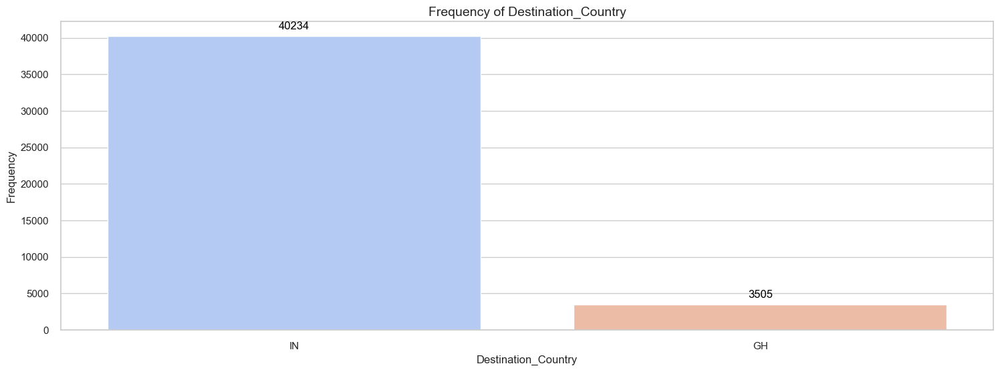

In [36]:
plot_frequency(dataset, 'Destination_Country', 'all')

In [37]:
# Defining func
def plot_map(df, cluster_column=None, color=False):
    map_center = [df['Drop_Latitude'].mean(), df['Drop_Longitude'].mean()]
    map_ = folium.Map(location=map_center, zoom_start=11, tiles="OpenStreetMap")
    
    folium.raster_layers.TileLayer(
        tiles="http://mt1.google.com/vt/lyrs=m&h1=p1Z&x={x}&y={y}&z={z}",
        name="Standard Roadmap",
        attr="Google Map"
    ).add_to(map_)

    if cluster_column == None:
        for index, row in df.iterrows():
            folium.Marker(location=[row['Drop_Latitude'], row['Drop_Longitude']],  # Latitude and Longitude
                              popup=row[[ 'Order_ID', 'Pickup_Time', 'Area', 'Category', 'Time_Category']],  # Popup showing the location name
                              icon=folium.DivIcon(html = '''<i class="fa-solid fa-location-dot" style="color: #f50505; font-size: 15px"></i>''')
                             ).add_to(map_)
    else:
        if color:
            for index, row in df.iterrows():
                folium.Marker(location=[row['Drop_Latitude'], row['Drop_Longitude']],  # Latitude and Longitude
                              popup=row[[ 'Order_ID', 'Pickup_Time', 'Area', 'Category', 'Time_Category', "pickup_location_Cluster", "time_Cluster"]],  # Popup showing the location name
                              icon=folium.DivIcon(html = f'''<i class="fa-solid fa-location-dot" style="color: {row[color]}; font-size: 15px"></i>''')
                             ).add_to(map_)
        else:
            for index, row in df.iterrows():
                folium.Marker(location=[row['Drop_Latitude'], row['Drop_Longitude']],  # Latitude and Longitude
                              popup=row[[ 'Order_ID', 'Pickup_Time', 'Area', 'Category', 'time_Category', "pickup_location_Cluster"]],  # Popup showing the location name
                              icon=folium.DivIcon(html = f'''<i class="fa-solid fa-location-dot" style="color: #f50505; font-size: 15px"></i>''')
                             ).add_to(map_)


    return map_


In [38]:
dfr = dataset[dataset["Destination_Country"] == "GH"]
plot_map(df=dfr)

In [39]:
# Removing inaccurate data

dataset = dataset[dataset["Destination_Country"] != "GH"]

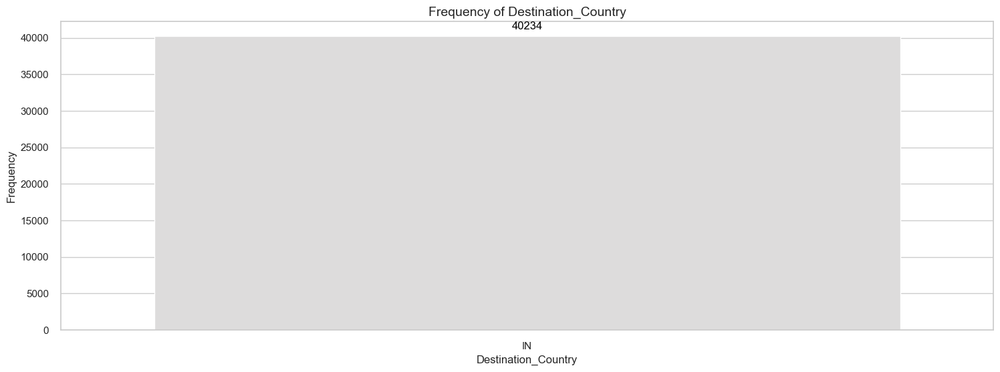

In [40]:
plot_frequency(dataset,'Destination_Country', 10)

In [41]:
dfr = dataset[dataset["Destination_Country"] == "IN"].sample(100)
plot_map(df=dfr)

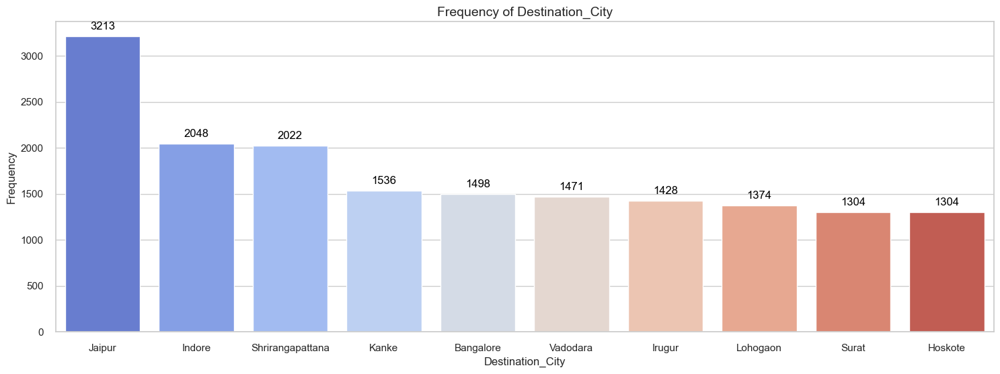

In [42]:
plot_frequency(dataset,'Destination_City', 10)

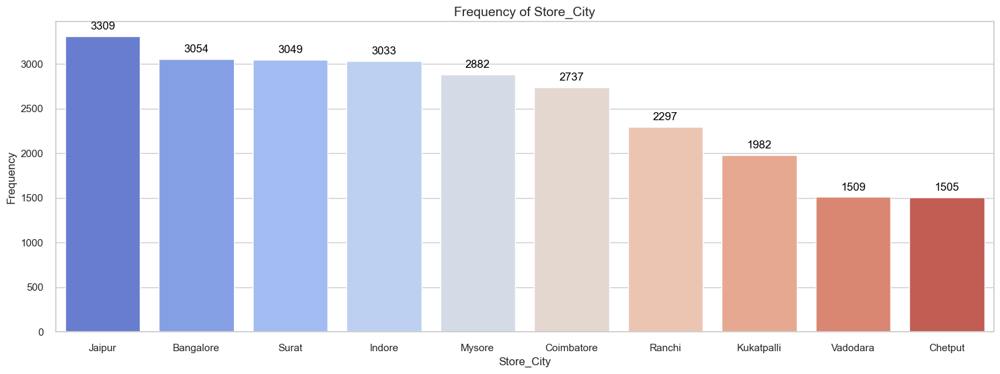

In [43]:
plot_frequency(dataset,'Store_City', 10)

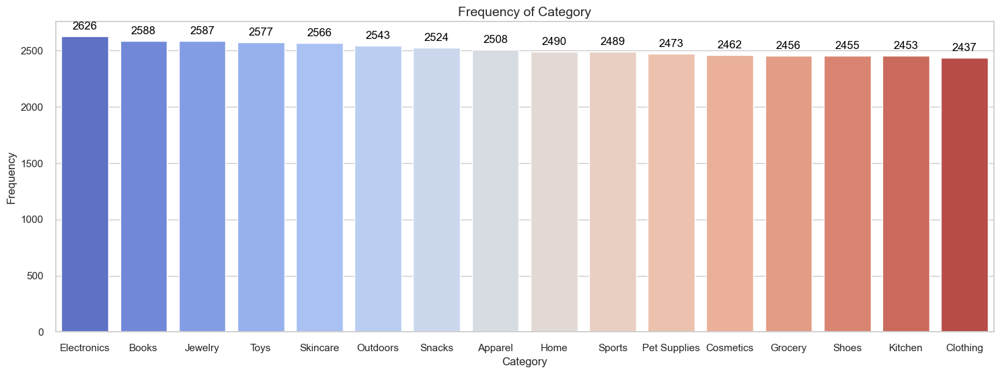

In [44]:
plot_frequency(dataset,'Category', 'all')

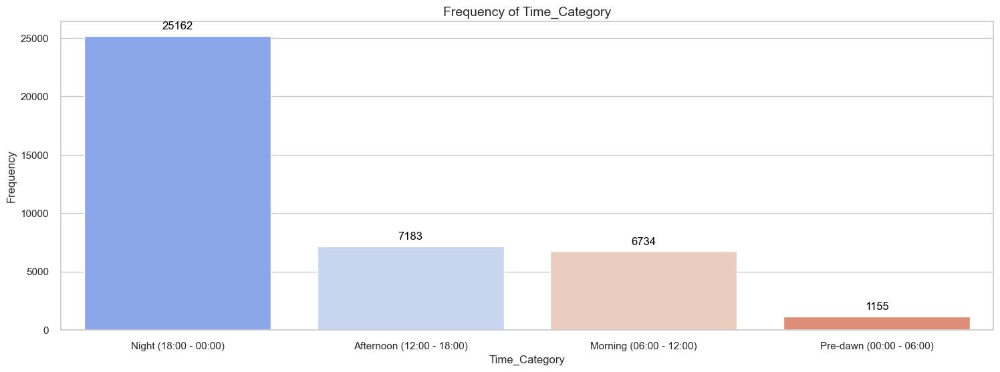

In [45]:
plot_frequency(dataset,'Time_Category', 'all')

In [46]:
# Function to plot line chart of hour in a 24 hour range
def time_line_chart(dataset, col):
    df_pickup = dataset.copy()
    df_pickup[col] = pd.to_datetime(dataset[col], format='%H:%M:%S').dt.time
    df_pickup['Hour'] = pd.to_datetime(df_pickup[col], format='%H:%M:%S').dt.hour
    
    # Group by Pickup_Hour to get the frequency of pickups by hour
    hourly_pickups = df_pickup.groupby('Hour').size()
    
    # Plot the line chart
    plt.figure(figsize=(10, 6))
    plt.plot(hourly_pickups.index, hourly_pickups.values, marker='o', color='skyblue', linestyle='-', linewidth=2)
    plt.xlabel('Hour of the Day')
    plt.ylabel('Number of Pickups')
    plt.title(f'{col} Hour Distribution Throughout the Day')
    plt.xticks(range(0, 24))  # Show all hours from 0 to 23
    plt.grid(True)

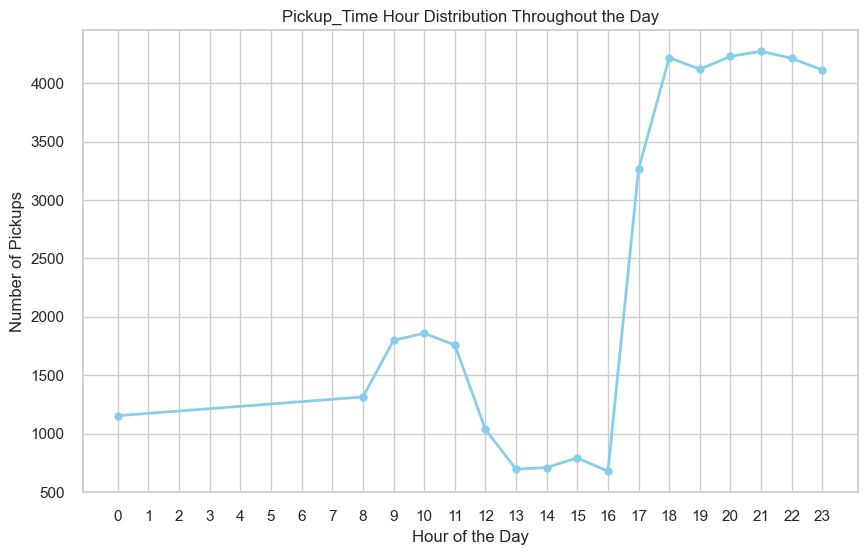

In [47]:
time_line_chart(dataset, "Pickup_Time")

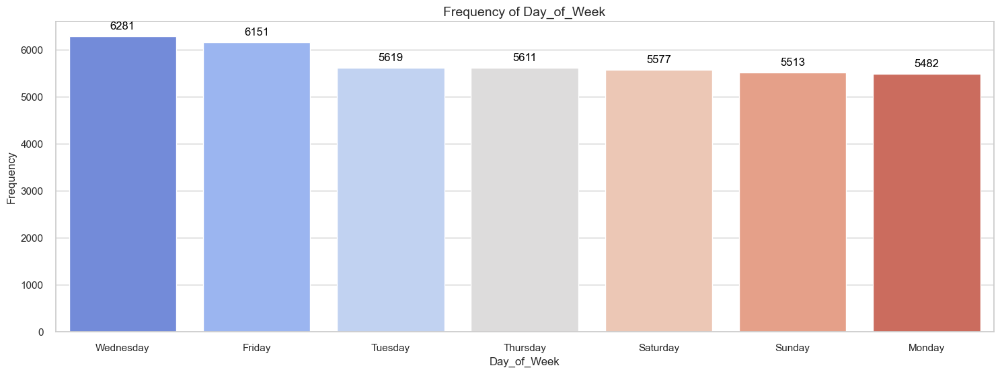

In [48]:
plot_frequency(dataset,'Day_of_Week', 'all')

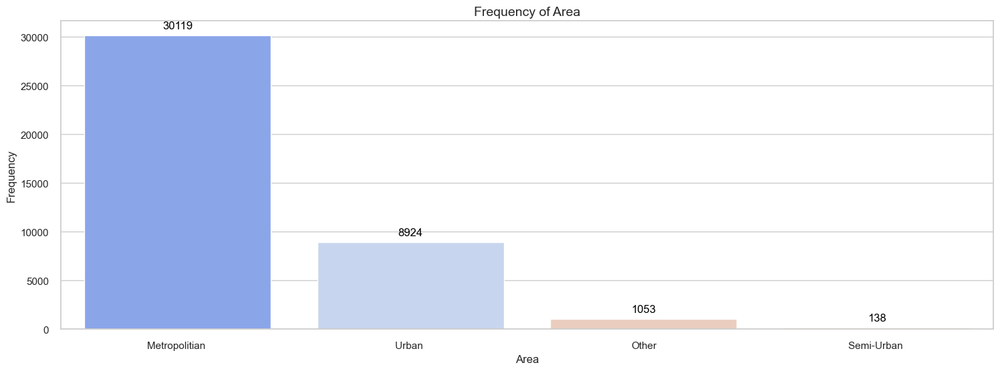

In [49]:
plot_frequency(dataset,'Area', 'all')

In [50]:
busiest_city = dataset['Destination_City'].mode()[0]
busiest_city = dataset[dataset['Destination_City'] == busiest_city]

In [51]:
busiest_city.head()

,Order_ID,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Category,Time_Category,Day_of_Week,Store_City,Store_Country,Destination_City,Destination_Country,Distance_km
25,edrh271340988,26.849596,75.800512,26.879596,75.830512,2022-04-05,20:35:00,20:40:00,Stormy,Jam,motorcycle,Urban,Cosmetics,Night (18:00 - 00:00),Tuesday,Jaipur,IN,Jaipur,IN,4.470286
57,vizd072469706,26.888420,75.800689,26.898420,75.810689,2022-03-26,09:25:00,09:40:00,Windy,Low,scooter,Other,Shoes,Morning (06:00 - 12:00),Saturday,Jaipur,IN,Jaipur,IN,1.489927
59,rxxx129114996,26.913987,75.752891,26.993987,75.832891,2022-03-29,22:25:00,22:35:00,Sandstorms,Low,scooter,Urban,Cosmetics,Night (18:00 - 00:00),Tuesday,Jaipur,IN,Jaipur,IN,11.916583
82,jzam829230168,26.913483,75.803139,26.933483,75.823139,2022-03-24,11:45:00,11:50:00,Stormy,High,motorcycle,Metropolitian,Kitchen,Morning (06:00 - 12:00),Thursday,Jaipur,IN,Jaipur,IN,2.979503
92,sdod930462581,26.891191,75.802083,26.981191,75.892083,2022-03-14,17:50:00,17:55:00,Sunny,Medium,van,Metropolitian,Home,Afternoon (12:00 - 18:00),Monday,Jaipur,IN,Jaipur,IN,13.407093


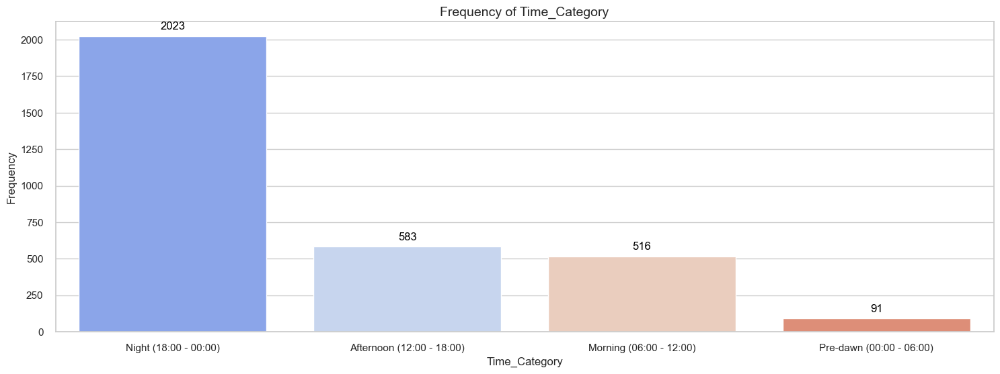

In [52]:
plot_frequency(busiest_city,'Time_Category', 'all')

In [53]:
#Taking the busiest day plus 13 consecutive days for 2 week's worth of data

busiest_city_busiest_day = busiest_city['Order_Date'].mode()[0]
fourteen_consecutive_days = [busiest_city_busiest_day]
for i in range(1, 14):
    fourteen_consecutive_days.append(busiest_city_busiest_day + pd.Timedelta(days=i))
print(fourteen_consecutive_days)

[Timestamp('2022-03-26 00:00:00'), Timestamp('2022-03-27 00:00:00'), Timestamp('2022-03-28 00:00:00'), Timestamp('2022-03-29 00:00:00'), Timestamp('2022-03-30 00:00:00'), Timestamp('2022-03-31 00:00:00'), Timestamp('2022-04-01 00:00:00'), Timestamp('2022-04-02 00:00:00'), Timestamp('2022-04-03 00:00:00'), Timestamp('2022-04-04 00:00:00'), Timestamp('2022-04-05 00:00:00'), Timestamp('2022-04-06 00:00:00'), Timestamp('2022-04-07 00:00:00'), Timestamp('2022-04-08 00:00:00')]


In [54]:
two_weeks_df = busiest_city[busiest_city["Order_Date"].isin(fourteen_consecutive_days)]

In [55]:
two_weeks_df.count()

Order_ID               1071
Store_Latitude         1071
Store_Longitude        1071
Drop_Latitude          1071
Drop_Longitude         1071
Order_Date             1071
Order_Time             1071
Pickup_Time            1071
Weather                1071
Traffic                1071
Vehicle                1071
Area                   1071
Category               1071
Time_Category          1071
Day_of_Week            1071
Store_City             1071
Store_Country          1071
Destination_City       1071
Destination_Country    1071
Distance_km            1071
dtype: int64

In [56]:
plot_map(df=two_weeks_df)

In [57]:
two_weeks_df.head()

,Order_ID,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Category,Time_Category,Day_of_Week,Store_City,Store_Country,Destination_City,Destination_Country,Distance_km
25,edrh271340988,26.849596,75.800512,26.879596,75.830512,2022-04-05,20:35:00,20:40:00,Stormy,Jam,motorcycle,Urban,Cosmetics,Night (18:00 - 00:00),Tuesday,Jaipur,IN,Jaipur,IN,4.470286
57,vizd072469706,26.888420,75.800689,26.898420,75.810689,2022-03-26,09:25:00,09:40:00,Windy,Low,scooter,Other,Shoes,Morning (06:00 - 12:00),Saturday,Jaipur,IN,Jaipur,IN,1.489927
59,rxxx129114996,26.913987,75.752891,26.993987,75.832891,2022-03-29,22:25:00,22:35:00,Sandstorms,Low,scooter,Urban,Cosmetics,Night (18:00 - 00:00),Tuesday,Jaipur,IN,Jaipur,IN,11.916583
117,ohhc448549441,26.892312,75.806896,26.922313,75.836896,2022-04-03,20:50:00,21:05:00,Cloudy,Jam,motorcycle,Metropolitian,Jewelry,Night (18:00 - 00:00),Sunday,Jaipur,IN,Jaipur,IN,4.469621
214,ljgp550489562,26.911927,75.797282,27.051927,75.937282,2022-03-29,22:55:00,23:00:00,Stormy,Low,scooter,Metropolitian,Snacks,Night (18:00 - 00:00),Tuesday,Jaipur,IN,Jaipur,IN,20.851726


In [58]:
two_weeks_df["Distance_km"].describe()

count    1071.000000
mean       10.000335
std         5.993261
min         1.489529
25%         4.469621
50%         8.938589
75%        13.407063
max        20.857115
Name: Distance_km, dtype: float64

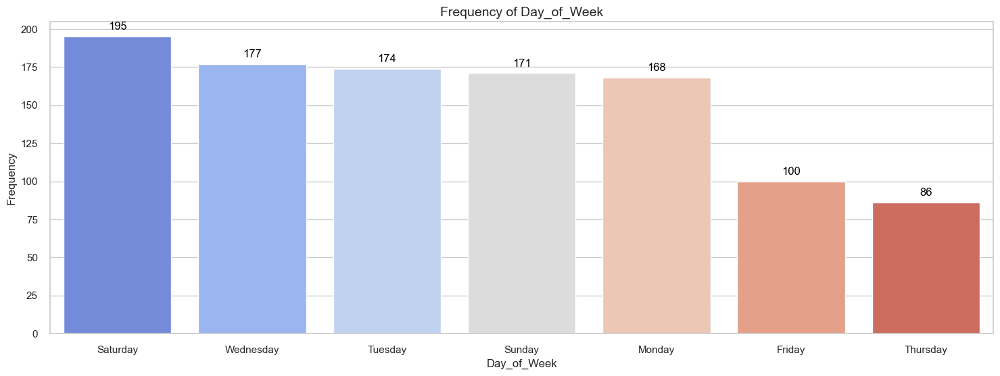

In [59]:
plot_frequency(two_weeks_df,  'Day_of_Week', 'all')

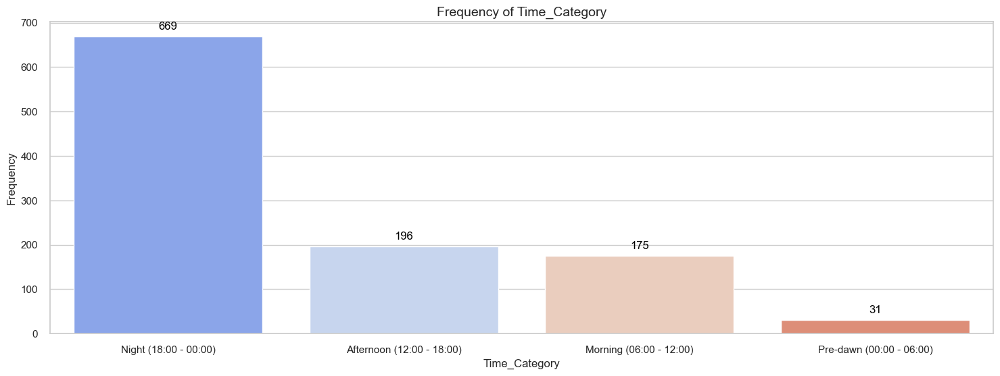

In [60]:
plot_frequency(two_weeks_df,  'Time_Category', 'all')

In [61]:
# Selecting features for training
focus_training_dataset = two_weeks_df[["Store_Latitude", "Store_Longitude", "Drop_Latitude", "Drop_Longitude",
                                                           "Area", "Category", "Pickup_Time", "Time_Category"]]

In [62]:
focus_training_dataset.head()

,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Area,Category,Pickup_Time,Time_Category
25,26.849596,75.800512,26.879596,75.830512,Urban,Cosmetics,20:40:00,Night (18:00 - 00:00)
57,26.888420,75.800689,26.898420,75.810689,Other,Shoes,09:40:00,Morning (06:00 - 12:00)
59,26.913987,75.752891,26.993987,75.832891,Urban,Cosmetics,22:35:00,Night (18:00 - 00:00)
117,26.892312,75.806896,26.922313,75.836896,Metropolitian,Jewelry,21:05:00,Night (18:00 - 00:00)
214,26.911927,75.797282,27.051927,75.937282,Metropolitian,Snacks,23:00:00,Night (18:00 - 00:00)


In [63]:
focus_training_dataset.describe()

,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude
count,1071.000000,1071.000000,1071.000000,1071.000000
mean,26.898673,75.793756,26.965807,75.860890
std,0.031718,0.016907,0.053684,0.042798
min,26.766536,75.752820,26.776536,75.762821
25%,26.892312,75.792934,26.932908,75.827282
50%,26.905287,75.794592,26.963726,75.857333
75%,26.913483,75.802300,27.001378,75.890753
max,26.956431,75.837333,27.086431,75.950753


In [64]:
focus_training_dataset.isnull().sum()

Store_Latitude     0
Store_Longitude    0
Drop_Latitude      0
Drop_Longitude     0
Area               0
Category           0
Pickup_Time        0
Time_Category      0
dtype: int64

In [65]:
# CLASS FOR AUTOMATED MODEL DEVELOPMENT

class ModelTrainer:
    def __init__(self, dataframe, priorities):
        # Initialize the ModelTrainer class with the main dataset, priorities, and other essential attributes.
        self.dataset = dataframe
        self.main_dataframe = two_weeks_df
        self.labeled_dataset = None
        self.priorities = priorities
        self.preprocessed = None
        self.labels = dict()
        self.y_kmeans = dict()
        
        # Define random colors to assist with cluster visualization for different dimensions.
        self.colors = {
            "time": ["#00008B", "#2E8B57", "#FFD700", "#FF8C00", "#FF4500", "#FF6347", "#FF69B4", "#6A5ACD", "#483D8B", "#8B0000"],
            "pickup_location": ["#FF5733", "#33FF57", "#3357FF", "#FFD700", "#900C3F", "#FFC300", "#581845", "#DAF7A6", "#C70039", "#900C3F"],
            "store_location": ["#FF5733", "#33FF57", "#3357FF", "#FFD700", "#900C3F", "#FFC300", "#581845", "#DAF7A6", "#C70039", "#900C3F"],
            "goods_Category": ["#FF6347", "#3CB371", "#4682B4", "#FFD700", "#6A5ACD", "#FF1493", "#40E0D0", "#FFA500", "#DC143C", "#ADFF2F"]
        }
        print("ModelTrainer Instance created successfully")

    def numeric_encoder(self):
        # One-hot encode categorical columns: 'Area', 'Category', 'Time_Category'.
        encode = OneHotEncoder(drop='first')
        columns = ['Area', 'Category', "Time_Category"]
        
        # Fit and transform the categorical data.
        encoded_array = encode.fit_transform(self.dataset[columns]).toarray()
        encoded = pd.DataFrame(encoded_array, columns=encode.get_feature_names_out(columns))
        return encoded

    def cyclical_encoder(self):
        # Encode time data cyclically using sine and cosine transformations.
        time_dataset = self.dataset[['Pickup_Time']].copy()
        
        # Extract the hour from the Pickup_Time and apply cyclic encoding.
        time_dataset['hour'] = pd.to_datetime(time_dataset['Pickup_Time'], format='%H:%M:%S').dt.hour
        columns = ['hour_sin', 'hour_cos']
        time_dataset[columns[0]] = np.sin(2 * np.pi * time_dataset['hour'] / 24)
        time_dataset[columns[1]] = np.cos(2 * np.pi * time_dataset['hour'] / 24)
        
        # Convert to DataFrame for consistency with other features.
        cyclical_features = time_dataset[columns].to_numpy()
        encoded_cyclical_features = pd.DataFrame(cyclical_features, columns=columns)
        return encoded_cyclical_features

    def data_scaler(self):
        # Scale latitude and longitude coordinates between 0 and 1 for clustering.
        scaler = MinMaxScaler()
        columns = ['Store_Latitude', 'Store_Longitude', 'Drop_Latitude', 'Drop_Longitude']
        
        # Apply MinMax scaling to ensure coordinates are in a comparable range.
        features = scaler.fit_transform(self.dataset[columns])
        df = pd.DataFrame(features, columns=columns)
        return df

    def raw_preprocess(self):
        # Combine all preprocessed features into a final DataFrame.
        non_numerical_features = self.numeric_encoder()  # Categorical features
        cyclical_features = self.cyclical_encoder()      # Time-based features
        numerical_features = self.data_scaler()          # Scaled spatial features
        
        # Concatenate all features to create the preprocessed dataset.
        final_preprocessed = pd.concat([numerical_features, cyclical_features, non_numerical_features], axis=1)
        self.preprocessed = final_preprocessed
        return final_preprocessed

    def get_encoded_array(self):
        # Get preprocessed data as a NumPy array for clustering.
        return self.raw_preprocess().to_numpy()

    def weighted_array(self, dimension):
        # Adjust feature importance based on specified priorities for clustering.
        features_list = self.priorities[1][dimension]  # Priority features for the given dimension
        enc_array = self.get_encoded_array()
        
        # Apply weights to specified features based on priorities.
        for index, column in enumerate(self.preprocessed.columns):
            for f in features_list:
                if f in column:
                    enc_array[:, index] *= self.priorities[0][dimension]["importance"]
        return enc_array

    def view_elbow(self, dimension):
        # Visualize the elbow method for optimal k selection.
        inertia = []
        for i in range(1, 11):
            kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
            if dimension:
                kmeans.fit(self.weighted_array(dimension))
            else:
                kmeans.fit(self.get_encoded_array())
            inertia.append(kmeans.inertia_)
        
        # Plot the inertia (within-cluster sum of squares) for different values of k.
        plt.figure(figsize=(10, 6))
        plt.plot(range(1, 11), inertia)
        plt.title(f'Elbow Method for Optimal k for {dimension}')
        plt.xlabel('Number of Clusters (k)')
        plt.ylabel('Inertia')
        plt.show()

    def view_elbow_alt(self, dimension):
        # Alternative elbow visualization using KElbowVisualizer.
        kmeans = KMeans(random_state=42)
        visualizer = KElbowVisualizer(kmeans, k=(1, 11), timings=False)
        
        # Fit the visualizer on weighted or unweighted data.
        if dimension:
            visualizer.fit(self.weighted_array(dimension))
        else:
            visualizer.fit(self.get_encoded_array())
        visualizer.poof()

    def view_dendrogram(self, dimension):
        # Generate a dendrogram for hierarchical clustering.
        linked = linkage(self.weighted_array(dimension), method='ward')
        plt.figure(figsize=(10, 7))
        dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
        plt.title(f'Dendrogram for {dimension}')
        plt.xlabel('Sample Index')
        plt.ylabel('Distance')
        plt.show()
        
    def get_silhouette_score(self, dimension):
        # Calculate the silhouette score for different values of k to find the optimal k.
        k_values = range(2, 11)
        silhouette_scores = []
        
        for k in k_values:
            kmeans = KMeans(n_clusters=k)
            X = self.weighted_array(dimension) if dimension else self.get_encoded_array()
            kmeans.fit(X)
            score = silhouette_score(X, kmeans.labels_)
            silhouette_scores.append(score)

        scr = k_values[np.argmax(silhouette_scores)]
        print(f"\nevaluated k={scr} for {dimension}")
        return k_values[np.argmax(silhouette_scores)]

    def get_pca(self, dimension):
        # Reduce data to two principal components for easier visualization.
        pca = PCA(n_components=2)
        array = self.weighted_array(dimension) if dimension else self.get_encoded_array()
        data_pca = pca.fit_transform(array)
        
        print(f"explained variance ratio: {sum(pca.explained_variance_ratio_)}")
        return data_pca 

    def train_KMeans_algorithm(self):
        # Train KMeans clustering algorithm based on specified priorities or automatically chosen k.
        print("Using KMeans Algorithm")

        if len(self.priorities[0]) > 0:         
            for i, feature_ in enumerate(self.priorities[0]):
                k = self.priorities[0][feature_]["clusters"]
                if k == "auto":
                    k = self.get_silhouette_score(feature_)
                        
                kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
                clusters = kmeans.fit(self.weighted_array(feature_))

                self.labels[feature_] = clusters.labels_
                self.y_kmeans[feature_] = clusters.predict(self.weighted_array(feature_))
                print(f"{feature_} cluster group created  with k={k}: {sorted(list(set(self.labels[feature_])))}")
        else:
            k = self.get_silhouette_score(None)
            kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
            clusters = kmeans.fit(self.get_encoded_array())
            self.labels[feature_] = clusters.labels_
            self.y_kmeans[feature_] = clusters.predict(self.get_encoded_array())
            print(f"{feature_} cluster group created  with k={k}: {sorted(list(set(self.labels[feature_])))}")

    def train_Agglo_algorithm(self):
        # Train Agglomerative Clustering based on priorities or automatically chosen k.
        print("Using AgglomerativeClustering Algorithm")
        
        if len(self.priorities[0]) > 0: 
            for i, feature_ in enumerate(self.priorities[0]):
                k = self.priorities[0][feature_]["clusters"]
                if k == "auto":
                    k = self.get_silhouette_score(feature_)        
                    
                agg_clustering = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
                labels = agg_clustering.fit_predict(self.weighted_array(feature_))

                self.labels[feature_] = labels
                print(f"{feature_} cluster group created  with k={k}: {sorted(list(set(labels)))}")
        else:
            k = self.get_silhouette_score(None)
            agg_clustering = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
            labels = agg_clustering.fit_predict(self.get_encoded_array())
            self.labels[feature_] = labels
            print(f"{feature_} cluster group created  with k={k}: {sorted(list(set(labels)))}")

    def label_main_dataframe(self):
        # Label the main DataFrame with cluster assignments and assign colors for visualization.
        dataset = self.main_dataframe.copy()
        for labels_names, labels in self.labels.items():
            colors = self.colors[labels_names]
            dataset.loc[:, f'{labels_names}_Cluster'] = labels
            dataset.loc[:, f'{labels_names}_Cluster_Color'] = dataset[f'{labels_names}_Cluster'].map(lambda label: colors[label])
            dataset[f'{labels_names}_Cluster'] += 1
        self.labeled_dataset = dataset
        return dataset
    
            
    def view_scatter_plot(self, dimension):
        # Visualize clusters in 2D using a scatter plot after PCA reduction.
        k = self.priorities[0][dimension]["clusters"]
        try: 
            labels_ = self.y_kmeans[dimension]
        except KeyError:
            labels_ = self.labels[dimension]
            
        colors = self.colors[dimension]
        data_pca = self.get_pca(dimension)

        plt.figure(figsize=(10, 7))
        for i in range(k):
            sns.scatterplot(x=data_pca[labels_ == i, 0], y=data_pca[labels_ == i, 1], s=100,  c = colors[i], label = f"cluster {i + 1}")
        plt.title(f'{dimension} based Custer of Orders')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.show()


    def map_view(self, plan):
         # Visualize a map of the clustered data points based on specified plan.
        delivery_plan_dataframe = self.labeled_dataset
        
        color = plan.pop('color', None)
        color = f"{color}_Color"

        for i in plan:
            delivery_plan_dataframe = delivery_plan_dataframe.loc[delivery_plan_dataframe[i].isin(plan[i])]
        
        print(f"Dates: {plan["Order_Date"]}")
        print(f"Count: {len(delivery_plan_dataframe)}")
        
        if len(delivery_plan_dataframe) > 0:
            map_plot = plot_map(df=delivery_plan_dataframe, cluster_column=True, color=color)
            display(map_plot)
        else:
            print(f"Sorry, there are no datapoints to plot for this cluster")



In [66]:
# Setting feature groups and priorities
feature_group = {
    "time": ["hour_sin", "hour_cos", "Time_Category"],
    "pickup_location": ["Drop_Latitude", "Drop_Longitude"],
    "store_location": ["Store_Latitude", "Store_Longitude"],
    "goods_Category": ["Category"],
}
priorities = {
    "time": {"features":feature_group["time"], "importance": 2, "clusters": "auto"},
    "pickup_location": {"features":feature_group["pickup_location"], "importance": 10, "clusters": "auto"},
    "goods_Category": {"features":feature_group["goods_Category"], "importance": 4, "clusters": "auto"}
}

In [67]:
# Creating an instance of the model trainer
DeliveryModel = ModelTrainer(dataframe=focus_training_dataset, priorities=[priorities, feature_group])

ModelTrainer Instance created successfully


In [68]:
DeliveryModel.raw_preprocess().head(3)

,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,hour_sin,hour_cos,Area_Other,Area_Semi-Urban,Area_Urban,Category_Books,...,Category_Outdoors,Category_Pet Supplies,Category_Shoes,Category_Skincare,Category_Snacks,Category_Sports,Category_Toys,Time_Category_Morning (06:00 - 12:00),Time_Category_Night (18:00 - 00:00),Time_Category_Pre-dawn (00:00 - 06:00)
0,0.437400,0.564316,0.332564,0.360189,-0.866025,0.500000,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.641849,0.566410,0.393307,0.254709,0.707107,-0.707107,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.776487,0.000840,0.701693,0.372848,-0.500000,0.866025,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


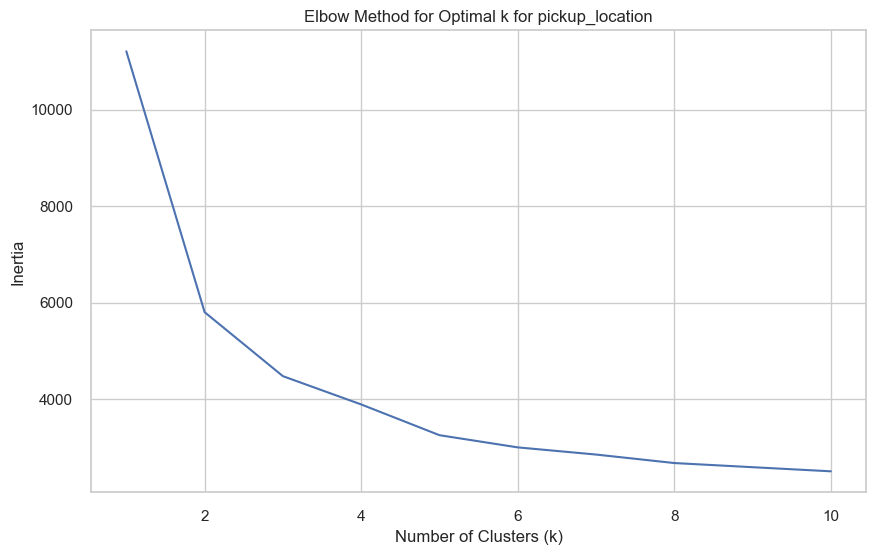

In [69]:
# Viewing elbow when location is prioritised

DeliveryModel.view_elbow("pickup_location")

In [70]:
# Resetting pickup_location clusters

DeliveryModel.priorities[0]["pickup_location"]["clusters"] = 5
print(DeliveryModel.priorities[0]["pickup_location"])

{'features': ['Drop_Latitude', 'Drop_Longitude'], 'importance': 10, 'clusters': 5}


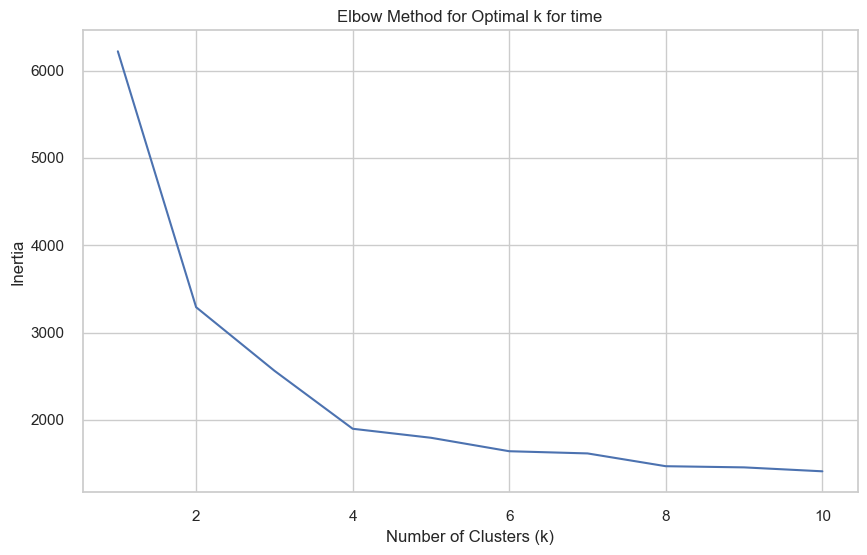

In [71]:
# Viewing elbow when time is prioritised

DeliveryModel.view_elbow("time")

In [72]:
# Resetting time clusters

DeliveryModel.priorities[0]["time"]["clusters"] = 4
print(DeliveryModel.priorities[0]["time"])

{'features': ['hour_sin', 'hour_cos', 'Time_Category'], 'importance': 2, 'clusters': 4}


In [73]:
# Training model using KMeans Algorithm

DeliveryModel.train_KMeans_algorithm()

Using KMeans Algorithm
time cluster group created  with k=4: [0, 1, 2, 3]
pickup_location cluster group created  with k=5: [0, 1, 2, 3, 4]

evaluated k=10 for goods_Category
goods_Category cluster group created  with k=10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


explained variance ratio: 0.8185547545039022


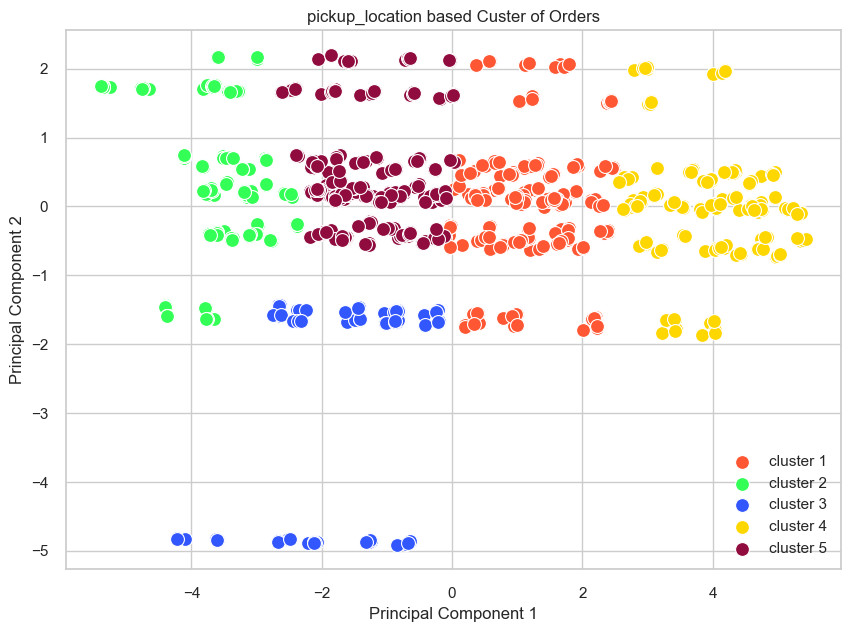

In [74]:
# Viewing scatter plot for location clusters

DeliveryModel.view_scatter_plot("pickup_location")

explained variance ratio: 0.7188040215906443


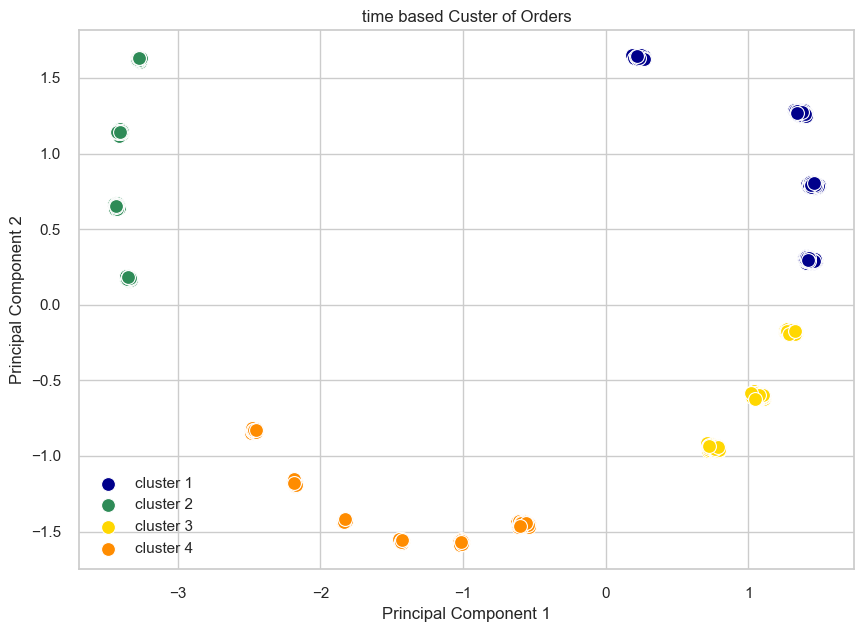

In [75]:
# Viewing scatter plot for time clusters

DeliveryModel.view_scatter_plot("time")

In [76]:
DeliveryModel.label_main_dataframe().head(3)

,Order_ID,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,...,Store_Country,Destination_City,Destination_Country,Distance_km,time_Cluster,time_Cluster_Color,pickup_location_Cluster,pickup_location_Cluster_Color,goods_Category_Cluster,goods_Category_Cluster_Color
25,edrh271340988,26.849596,75.800512,26.879596,75.830512,2022-04-05,20:35:00,20:40:00,Stormy,Jam,...,IN,Jaipur,IN,4.470286,3,#FFD700,3,#3357FF,8,#FFA500
57,vizd072469706,26.888420,75.800689,26.898420,75.810689,2022-03-26,09:25:00,09:40:00,Windy,Low,...,IN,Jaipur,IN,1.489927,2,#2E8B57,2,#33FF57,3,#4682B4
59,rxxx129114996,26.913987,75.752891,26.993987,75.832891,2022-03-29,22:25:00,22:35:00,Sandstorms,Low,...,IN,Jaipur,IN,11.916583,1,#00008B,5,#900C3F,8,#FFA500


In [81]:
planner = {
    "Order_Date": fourteen_consecutive_days[0:14], # Change index to view for individual days or a group of days
    "pickup_location_Cluster": [1, 2, 3, 4, 5],  # Change index to view for individual cluster or a group of clusters (1, 2, 3, 4, 5)
    "time_Cluster": [1, 2, 3, 4],
    "color": "time_Cluster"
}

DeliveryModel.map_view(plan=planner)

Dates: [Timestamp('2022-03-26 00:00:00'), Timestamp('2022-03-27 00:00:00'), Timestamp('2022-03-28 00:00:00'), Timestamp('2022-03-29 00:00:00'), Timestamp('2022-03-30 00:00:00'), Timestamp('2022-03-31 00:00:00'), Timestamp('2022-04-01 00:00:00'), Timestamp('2022-04-02 00:00:00'), Timestamp('2022-04-03 00:00:00'), Timestamp('2022-04-04 00:00:00'), Timestamp('2022-04-05 00:00:00'), Timestamp('2022-04-06 00:00:00'), Timestamp('2022-04-07 00:00:00'), Timestamp('2022-04-08 00:00:00')]
Count: 1071


### **ALGO CLUSTERING**

In [82]:
AggloDeliveryModel = ModelTrainer(dataframe=focus_training_dataset, priorities=[priorities, feature_group])

ModelTrainer Instance created successfully


In [83]:
AggloDeliveryModel.raw_preprocess()

,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,hour_sin,hour_cos,Area_Other,Area_Semi-Urban,Area_Urban,Category_Books,...,Category_Outdoors,Category_Pet Supplies,Category_Shoes,Category_Skincare,Category_Snacks,Category_Sports,Category_Toys,Time_Category_Morning (06:00 - 12:00),Time_Category_Night (18:00 - 00:00),Time_Category_Pre-dawn (00:00 - 06:00)
0,0.437400,0.564316,0.332564,0.360189,-0.866025,5.000000e-01,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.641849,0.566410,0.393307,0.254709,0.707107,-7.071068e-01,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.776487,0.000840,0.701693,0.372848,-0.500000,8.660254e-01,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.662345,0.639854,0.470408,0.394159,-0.707107,7.071068e-01,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.765639,0.526097,0.888659,0.928320,-0.258819,9.659258e-01,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1066,0.765639,0.526097,0.565969,0.396212,-0.707107,-7.071068e-01,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1067,0.437400,0.564316,0.397102,0.466610,-0.258819,9.659258e-01,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1068,0.656442,0.582904,0.466787,0.368548,-1.000000,-1.836970e-16,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1069,0.775113,0.000000,0.507236,0.053205,0.258819,-9.659258e-01,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


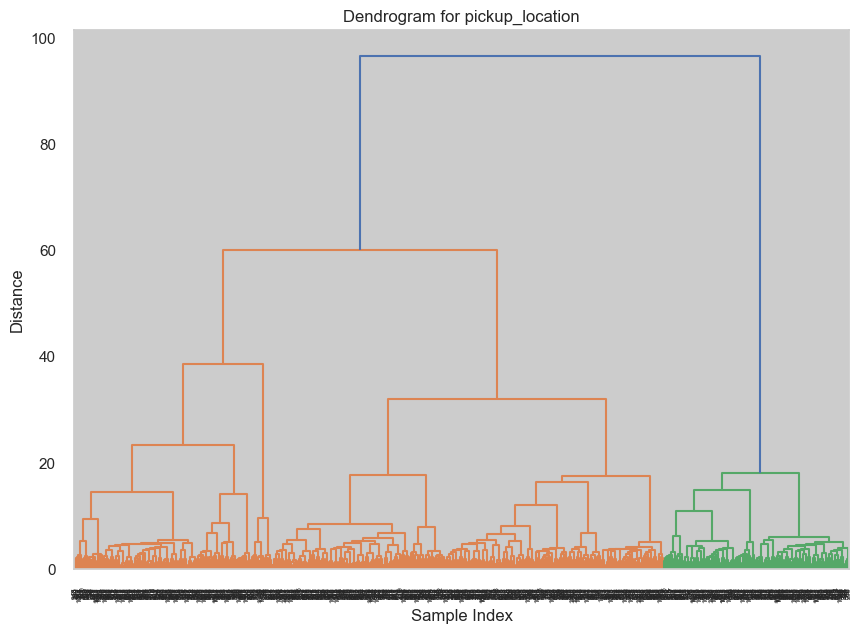

In [84]:
AggloDeliveryModel.view_dendrogram("pickup_location")

In [93]:
# Resetting pickup_location clusters

AggloDeliveryModel.priorities[0]["pickup_location"]["clusters"] = 3
print(AggloDeliveryModel.priorities[0]["pickup_location"])

{'features': ['Drop_Latitude', 'Drop_Longitude'], 'importance': 10, 'clusters': 3}


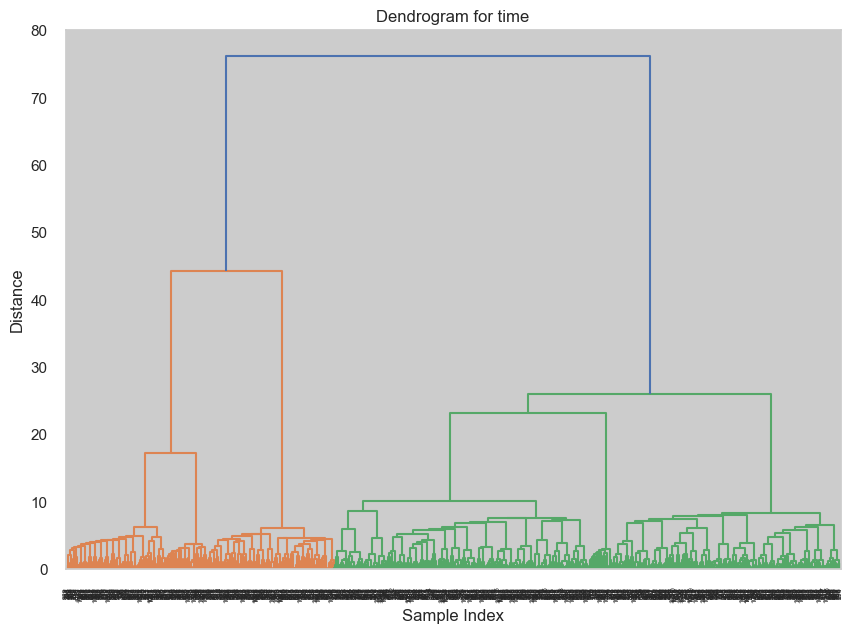

In [94]:
AggloDeliveryModel.view_dendrogram("time")

In [95]:
# Resetting pickup_location clusters

AggloDeliveryModel.priorities[0]["time"]["clusters"] = 3
print(AggloDeliveryModel.priorities[0]["time"])

{'features': ['hour_sin', 'hour_cos', 'Time_Category'], 'importance': 2, 'clusters': 3}


In [96]:
# Training model using KMeans Algorithm

AggloDeliveryModel.train_Agglo_algorithm()

Using AgglomerativeClustering Algorithm
time cluster group created  with k=3: [0, 1, 2]
pickup_location cluster group created  with k=3: [0, 1, 2]

evaluated k=9 for goods_Category
goods_Category cluster group created  with k=9: [0, 1, 2, 3, 4, 5, 6, 7, 8]


explained variance ratio: 0.8185547545039022


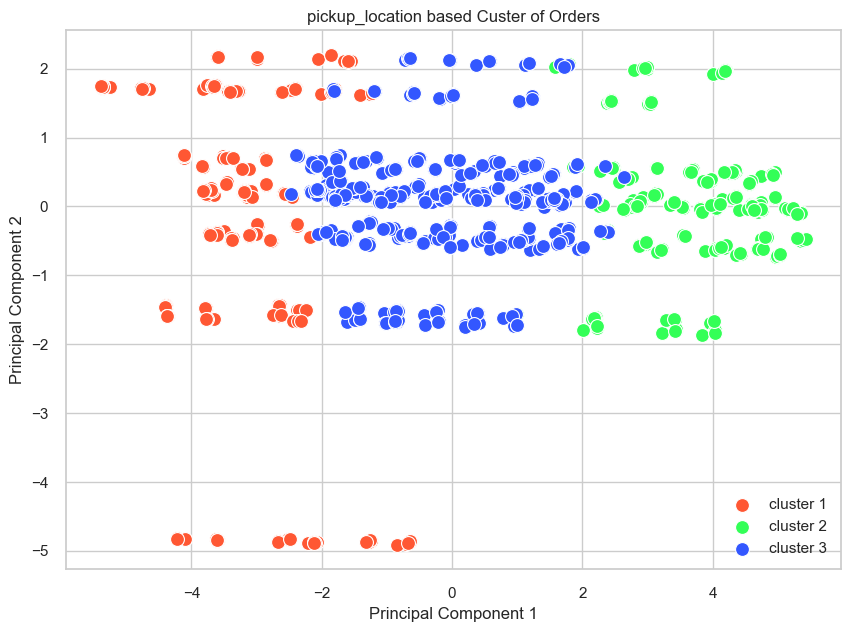

In [97]:
# Viewing scatter plot for location clusters

AggloDeliveryModel.view_scatter_plot("pickup_location")

explained variance ratio: 0.7188040215906443


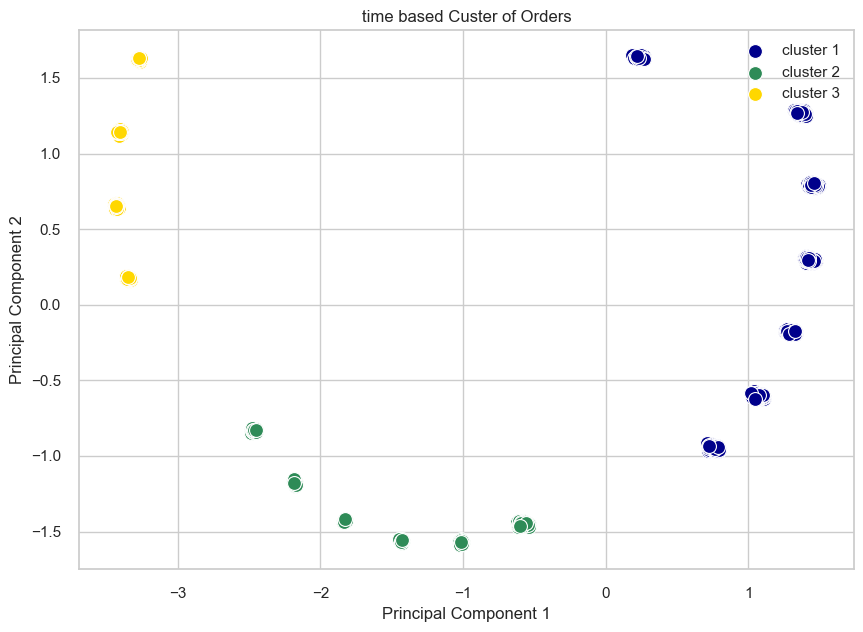

In [98]:
AggloDeliveryModel.view_scatter_plot("time")

In [99]:
AggloDeliveryModel.label_main_dataframe().head(3)

,Order_ID,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,...,Store_Country,Destination_City,Destination_Country,Distance_km,time_Cluster,time_Cluster_Color,pickup_location_Cluster,pickup_location_Cluster_Color,goods_Category_Cluster,goods_Category_Cluster_Color
25,edrh271340988,26.849596,75.800512,26.879596,75.830512,2022-04-05,20:35:00,20:40:00,Stormy,Jam,...,IN,Jaipur,IN,4.470286,1,#00008B,1,#FF5733,1,#FF6347
57,vizd072469706,26.888420,75.800689,26.898420,75.810689,2022-03-26,09:25:00,09:40:00,Windy,Low,...,IN,Jaipur,IN,1.489927,3,#FFD700,1,#FF5733,6,#FF1493
59,rxxx129114996,26.913987,75.752891,26.993987,75.832891,2022-03-29,22:25:00,22:35:00,Sandstorms,Low,...,IN,Jaipur,IN,11.916583,1,#00008B,3,#3357FF,1,#FF6347


In [140]:
planner = {
    "Order_Date": fourteen_consecutive_days[0:14], # Change index to view for individual days or a group of days
    "pickup_location_Cluster": [1],  # Change index to view for individual cluster or a group of clusters (1, 2, 3, 4, 5)
    "time_Cluster": [2],
    "color": "pickup_location_Cluster"
}


AggloDeliveryModel.map_view(plan=planner)

Dates: [Timestamp('2022-03-26 00:00:00'), Timestamp('2022-03-27 00:00:00'), Timestamp('2022-03-28 00:00:00'), Timestamp('2022-03-29 00:00:00'), Timestamp('2022-03-30 00:00:00'), Timestamp('2022-03-31 00:00:00'), Timestamp('2022-04-01 00:00:00'), Timestamp('2022-04-02 00:00:00'), Timestamp('2022-04-03 00:00:00'), Timestamp('2022-04-04 00:00:00'), Timestamp('2022-04-05 00:00:00'), Timestamp('2022-04-06 00:00:00'), Timestamp('2022-04-07 00:00:00'), Timestamp('2022-04-08 00:00:00')]
Count: 50


In [ ]:
len